# The Basis Mixer!

The previous notebooks explored the individual components of the Basis Function Models. In this notebook we will put everything together to render an expressive performance of a piece given its score.

In [1]:
import numpy as np
from partitura import save_performance_midi, load_musicxml, save_score_midi
from partitura.score import expand_grace_notes

from basismixer.performance_codec import get_performance_codec
from helper import load_model, compute_basis_from_xml
from helper.rendering import (post_process_predictions, 
                              path_to_trained_models)

## 0. Select a piece and trained models
We start by defining the piece we want to render (here is an example MusicXML file, but you can set your own!)

In [2]:
xml_fn = './sample_data/musicxml/Mozart_K265_1.musicxml'

Now we set the path to the directory of the trained models from our previous notebook (or any other trained models). Following the directory structure from the previous notebook, each

In [3]:
# models_dir = path_to_trained_models() # your trained model
models_dir = './sample_data/models' # pretrained model

## 1. Load the Predictive Model

The function `load_model` looks for the configuration files and the saved model parameters in `models_dir`. This function will return an instance of `FullPredictiveModel`, which is a conveniece *meta-model* which contains a list of the individual models (in `model.models`).

In [4]:
model, predicted_parameter_names = load_model(models_dir + '/sample_models')

Trained models include the following parameters:
beat_period_standardized
velocity_trend

The following parameters will use default values:

beat_period_mean:0.50
timing:0.00
velocity_dev:0.00
articulation_log:0.00
beat_period_std:0.10


In [5]:
# If you want to modify any of these default values just do
# model.default_values['parameter_name'] = value
# For example, for making the performance slower
beats_per_minute = 100
model.default_values['beat_period_mean'] = 60.0 / beats_per_minute
model.default_values['beat_period_std'] = 0.2

## 2. Computing the Score Representation.

We load the input MusicXML file specified above and compute the input score representation using the Basis Functions specified by the model (in `model.input_names`).

In [6]:
# Load MusicXML file
basis, part = compute_basis_from_xml(xml_fn, model.input_names)

                            o_map: --26 Slur start=n30 end=n33 start=None end=TimePoint t=26 quarter=4, substituting None

                            o_map: --26 Slur start=n30 end=n33 start=None end=TimePoint t=26 quarter=4, substituting None

                            o_map: --34 Slur start=n41 end=n43 start=None end=TimePoint t=34 quarter=4, substituting None

                            o_map: --42 Slur start=n51 end=n53 start=None end=TimePoint t=42 quarter=4, substituting None

                            o_map: --162 Slur start=n189 end=n191 start=None end=TimePoint t=162 quarter=4, substituting None

                            o_map: --54 Slur start=n63 end=n64 start=None end=TimePoint t=54 quarter=4, substituting None

                            o_map: --170 Slur start=n199 end=n201 start=None end=TimePoint t=170 quarter=4, substituting None

                            o_map: --128 Slur start=n141 end=n146 start=None end=TimePoint t=128 quarter=4, substituting None

    

## 3. Make Predict Performance

We make predictions of the performance using the models. , The `predict` method of `FullPredictiveModel` combines the predictions of the individual predictive models into a single output structured array, where the field names are the output parameters (specified in `model.output_names`).

In [7]:
preds = model.predict(basis, part.note_array['onset_beat'])
post_process_predictions(preds)
print('Field names:', preds.dtype.names)

Field names: ('velocity_trend', 'velocity_dev', 'beat_period_standardized', 'timing', 'articulation_log', 'beat_period_mean', 'beat_period_std')


## 4. Decode predictions

Finally, we decode the predictions using a `PerformanceCodec` and export the performance as a MIDI file. The output of the `decode` method is an instance of `partitura.performance.PerformedPart`.

In [8]:
perf_codec = get_performance_codec(model.output_names)
predicted_ppart = perf_codec.decode(part, preds)

Finally, we can export the predictions of the model as a MIDI file!

In [9]:
midi_fn = 'my_midi_output.mid'
save_performance_midi(predicted_ppart, midi_fn)

In [10]:
from helper.rendering import render_midi
save_score_midi(part, "score.mid")
render_midi("score.mid")

<DisplayHandle display_id=24b3dc2248d0f042788589cba2da90a9>

In [11]:
render_midi(midi_fn)

<DisplayHandle display_id=278568099773d333e7d61760ec455610>

<IPython.core.display.Javascript object>


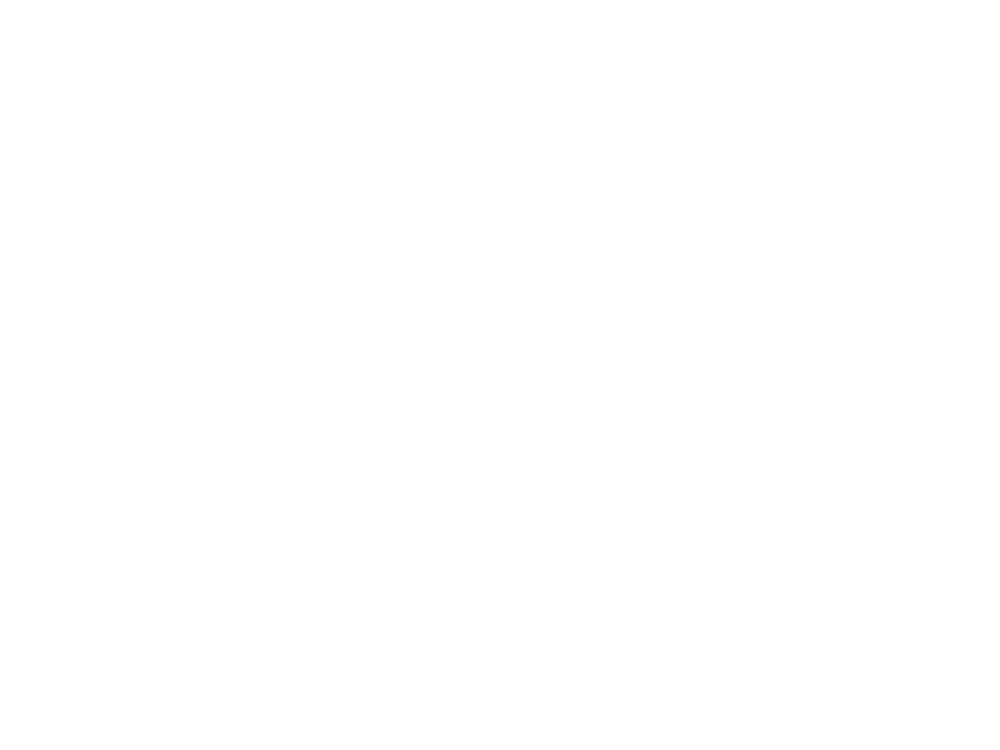

In [12]:
%matplotlib notebook
from helper.plotting import plot_predictions
plot_predictions(preds, part.note_array['onset_beat'], 
                 predicted_parameter_names)

In [13]:
#raise Exception('spam and eggs!')
asap_model, asap_predicted_parameter_names = load_model(models_dir + '/asap_trained')

asap_model.default_values['beat_period_mean'] = 60.0 / beats_per_minute
asap_model.default_values['beat_period_std'] = 0.2

basis, part = compute_basis_from_xml(xml_fn, asap_model.input_names)
preds = asap_model.predict(basis, part.note_array['onset_beat'])
post_process_predictions(preds)
print('Field names:', preds.dtype.names)

perf_codec = get_performance_codec(asap_model.output_names)
predicted_ppart = perf_codec.decode(part, preds)

midi_fn = 'my_asap_midi_output.mid'
save_performance_midi(predicted_ppart, midi_fn)

render_midi(midi_fn)

                            o_map: --34 Slur start=n41 end=n43 start=None end=TimePoint t=34 quarter=4, substituting None

                            o_map: --128 Slur start=n141 end=n146 start=None end=TimePoint t=128 quarter=4, substituting None

                            o_map: --154 Slur start=n178 end=n181 start=None end=TimePoint t=154 quarter=4, substituting None

                            o_map: --42 Slur start=n51 end=n53 start=None end=TimePoint t=42 quarter=4, substituting None

                            o_map: --162 Slur start=n189 end=n191 start=None end=TimePoint t=162 quarter=4, substituting None

                            o_map: --54 Slur start=n63 end=n64 start=None end=TimePoint t=54 quarter=4, substituting None

                            o_map: --170 Slur start=n199 end=n201 start=None end=TimePoint t=170 quarter=4, substituting None

                            o_map: --182 Slur start=n211 end=n212 start=None end=TimePoint t=182 quarter=4, substituting No

Trained models include the following parameters:
beat_period_standardized
velocity_trend

The following parameters will use default values:

beat_period_mean:0.50
timing:0.00
velocity_dev:0.00
articulation_log:0.00
beat_period_std:0.10
Field names: ('velocity_trend', 'velocity_dev', 'beat_period_standardized', 'timing', 'articulation_log', 'beat_period_mean', 'beat_period_std')


<DisplayHandle display_id=b6d53021c2cd5073ca7e9e5e99650f33>

<IPython.core.display.Javascript object>


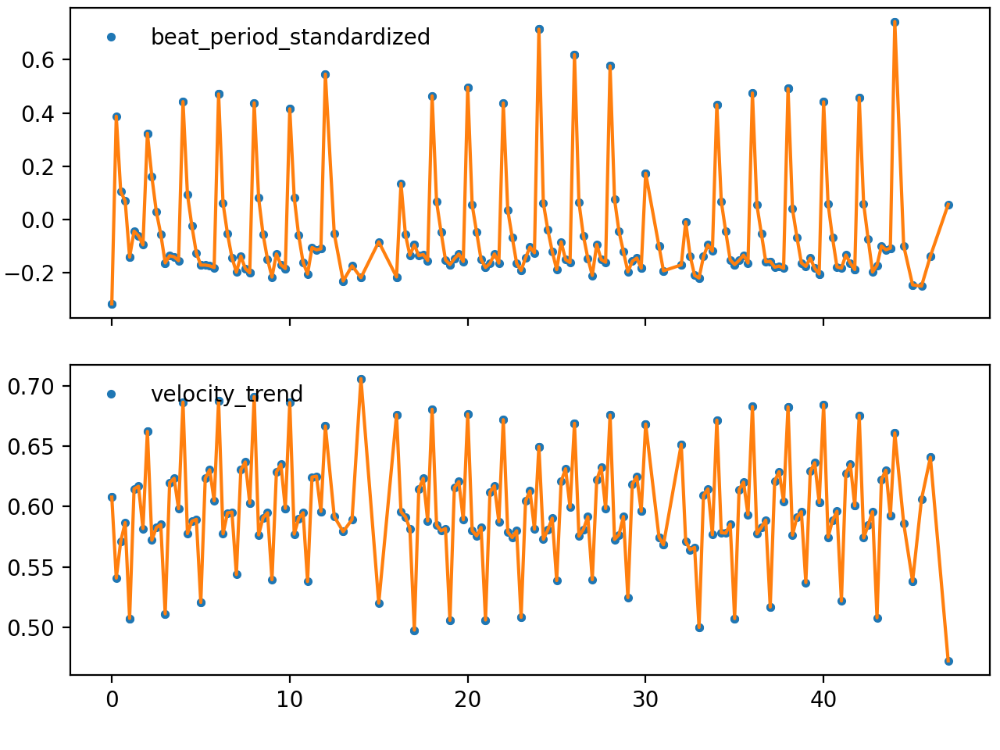

In [14]:
%matplotlib notebook
from helper.plotting import plot_predictions
plot_predictions(preds, part.note_array['onset_beat'], 
                 predicted_parameter_names)